# Generating Images of Digits from Text Prompts

<div style="background-color: #f0f8ff; border: 2px solid #4682b4; padding: 10px;">
<a href="https://colab.research.google.com/github/DeepTrackAI/DeepLearningCrashCourse/blob/main/Ch10_Diffusion/ec10_B_text2image/text2image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
<strong>If using Colab/Kaggle:</strong> You need to uncomment the code in the cell below this one.
You need also to copy the `mnist_sentences.json` and `test_sentences.txt` files from the
<a href="https://github.com/DeepTrackAI/DeepLearningCrashCourse/tree/main/Ch10_Diffusion/ec10_D_text2image">notebook folder</a> in GitHub to the Colab/Kaggle work directory.
</div>

In [ ]:
# !pip install contractions deeplay spacy  # Uncomment if using Colab/Kaggle.

This notebook provides you with a complete code example to generate MNIST digits from text prompts. The `mnist_sentences.json` and `test_sentences.txt` files provide the text data used for training and testing.

<div style="background-color: #f0f8ff; border: 2px solid #4682b4; padding: 10px;">
<strong>Note:</strong> This notebook contains the Code Example 10-B from the book  

**Deep Learning Crash Course**  
Giovanni Volpe, Benjamin Midtvedt, Jesús Pineda, Henrik Klein Moberg, Harshith Bachimanchi, Joana B. Pereira, Carlo Manzo  
No Starch Press, San Francisco (CA), 2026  
ISBN-13: 9781718503922  

[https://nostarch.com/deep-learning-crash-course](https://nostarch.com/deep-learning-crash-course)

You can find the other notebooks on the [Deep Learning Crash Course GitHub page](https://github.com/DeepTrackAI/DeepLearningCrashCourse).
</div>

## Importing the Dataset with Sentences and Corresponding Images

Implement the normalization of the digits ...

In [2]:
from torchvision.transforms import Compose, Normalize, ToTensor

trans = Compose([ToTensor(), Normalize(mean=[0.5], std=[0.5], inplace=True)])

... import the repository with the MNIST digits ...

In [3]:
import os

if not os.path.exists("MNIST_dataset"):
    os.system("git clone https://github.com/DeepTrackAI/MNIST_dataset")
MNIST_path = os.path.join("MNIST_dataset", "mnist", "train")
MNIST_images_files = sorted(os.listdir(MNIST_path))

... load the sentences corresponding to each digit ...

In [4]:
import json

with open("mnist_sentences.json", "r") as file:
    filenames_sentences = json.load(file)

... print some of these sentences ...

In [5]:
import random

for filename, sentence in random.sample(filenames_sentences.items(), 100):
    print(f"{filename} : {sentence}")

1_002201.png : In the hotel room, there are zero lamps, 9 sheets, and one dressers. How many storage dressers can you find?
2_001584.png : At the farm, there are nine farmers and two sheep. How many livestock are there?
7_002780.png : nine physicians work at a clinic, and 7 are surgeons. How many doctors are surgeons?
4_003571.png : Generate a clear image of the number four.
7_004760.png : Show me an image of a seven.
7_002382.png : Wandering around, there are two ducks, 2 rabbits, and 7 sheep. How many wool-bearing animals are there?
2_000507.png : In the cafeteria, there are 2 cups, six trays, and 8 baskets. How many drinking vessels are there?
6_003413.png : In the nursery, there are 1 pots, five vases, and six flowers. How many natural elements are there?
3_006035.png : 3 students passed the exam out of nine who took it. How many learners succeeded?
1_004012.png : Create a sample of the number 1.
5_003586.png : In the cafe, there are 7 cups, 2 teapots, and five jars. How many stora

/var/folders/nk/vplzgbvj0w1gpgk5h_j226480000gp/T/ipykernel_58455/1634883341.py:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  for filename, sentence in random.sample(filenames_sentences.items(), 100):


... create the training dataset with digit images and corresponding sentences ...

In [6]:
import matplotlib.pyplot as plt

images, digits, sentences = [], [], []
for filename in MNIST_images_files:
    image = plt.imread(os.path.join(MNIST_path, filename))
    images.append(trans(image))

    digit = int(filename[0])
    digits.append(digit)

    sentence = filenames_sentences.get(filename, "")
    sentences.append(sentence)

trainset = list(zip(images, digits, sentences))

... and plot some of the transformed MNIST digits.

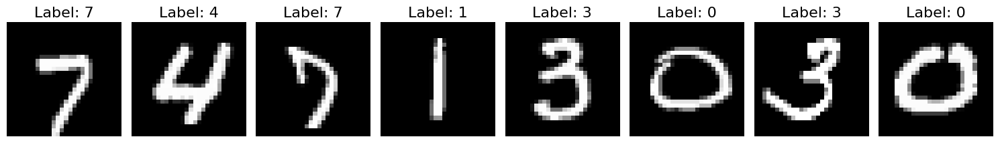

In [7]:
import torch
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 8, figsize=(15, 3))
for ax in axs.ravel():
    img, label, _ = trainset[torch.randint(0, len(trainset), (1,)).squeeze()]
    ax.imshow(img.squeeze(), cmap="gray")
    ax.set_title(f"Label: {label}", fontsize=16)
    ax.axis("off")
plt.tight_layout()
plt.show()

## Implementing the Forward Process

Define the device on which the computations are performed ...

In [8]:
def get_device():
    """Select device where to perform the computations."""
    if torch.cuda.is_available():
        return torch.device("cuda:0")
    ### elif torch.backends.mps.is_available():
    ###     return torch.device("mps")
    else:
        return torch.device("cpu")

device = get_device()

print(f"Selected device: {device}")

Selected device: cpu


... implement the forward diffusion process ...

In [9]:
class Diffusion:
    """Denoising diffusion probabilistic model (DDPM)."""

    def __init__(self, steps=1000, beta_start=1e-4, beta_end=0.02,
                 device=device):
        """Initialize the diffusion model."""
        self.steps, self.device = steps, device
        self.beta = torch.linspace(beta_start, beta_end, steps).to(device)
        self.alpha = 1.0 - self.beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)

    def forward_diffusion(self, x, t):
        """Implement the forward diffusion process."""
        sqrt_alpha_bar = torch.sqrt(self.alpha_bar[t])[:, None, None, None]
        sqrt_one_minus_alpha_bar = \
            torch.sqrt(1 - self.alpha_bar[t])[:, None, None, None]
        noise = torch.randn_like(x)
        return sqrt_alpha_bar * x + sqrt_one_minus_alpha_bar * noise, noise

... sampling images in the forward diffusion process ..

In [10]:
diffusion = Diffusion(steps=401, beta_start=0.0001, beta_end=0.02)

clean_image, label, _ = trainset[torch.randint(0, len(trainset), (1,)).squeeze()]

steps, noisy_images = [0, 100, 200, 300, 400], []
for t in steps:
    noisy_image, noise = diffusion.forward_diffusion(
        x=clean_image[None, ...].to(device), t=torch.tensor([t]).to(device),
    )
    noisy_images.append(noisy_image)

... and visualize the noisy digits generated in the forward diffusion process.

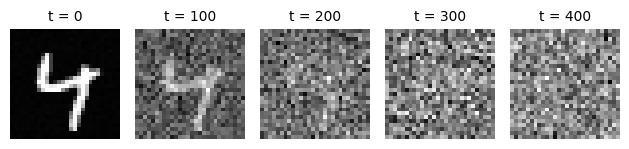

In [11]:
fig, axs = plt.subplots(1, len(steps))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(noisy_images[i].cpu().numpy().squeeze(), cmap="gray")
    ax.set_title(f"t = {steps[i]}", fontsize=10)
    ax.axis("off")
plt.tight_layout()
plt.show()

## Implementing the Reverse Diffusion Process

Update the `Diffusion` class to implement the reverse diffusion process.

In [12]:
from tqdm import tqdm

class Diffusion:
    """Denoising diffusion probabilistic model (DDPM)."""
    
    def __init__(self, steps=1000, beta_start=1e-4, beta_end=0.02, img_size=28,
                 device=device):
        """Initialize the diffusion model."""
        self.steps, self.img_size, self.device = steps, img_size, device
        self.beta = torch.linspace(beta_start, beta_end, steps).to(device)
        self.alpha = 1.0 - self.beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)

    def forward_diffusion(self, x, t):
        """Implement the forward diffusion process."""
        sqrt_alpha_bar = torch.sqrt(self.alpha_bar[t])[:, None, None, None]
        sqrt_one_minus_alpha_bar = \
            torch.sqrt(1 - self.alpha_bar[t])[:, None, None, None]
        noise = torch.randn_like(x)
        return sqrt_alpha_bar * x + sqrt_one_minus_alpha_bar * noise, noise
    
    def reverse_diffusion(self, model, n_images, n_channels, pos_enc_dim, 
                          pos_enc_func, fix_noise=None, save_time_steps=None, 
                          context=None, guidance_strength=None):
        """Reverse diffusion process."""
        with torch.no_grad():
            if fix_noise is not None:
                x = fix_noise.to(self.device)
            else:
                x = torch.randn(
                    (n_images, n_channels, self.img_size, self.img_size),
                ).to(self.device)
            
            denoised_images = []
            for i in tqdm(reversed(range(0, self.steps)),
                          desc="U-Net inference", total=self.steps):
                t = (torch.ones(n_images) * i).long()
                t_pos_enc = (pos_enc_func(t.unsqueeze(1), pos_enc_dim)
                             .to(self.device))
                if context is None:
                    pred_noise = model(x=x, t=t_pos_enc)
                else:
                    conditional_pred = model(x=x, t=t_pos_enc, context=context)
                    unconditional_pred = model(x=x, t=t_pos_enc, context=None)
                    pred_noise = torch.lerp(unconditional_pred,
                                                 conditional_pred,
                                                 guidance_strength)
                alpha = self.alpha[t][:, None, None, None]
                alpha_bar = self.alpha_bar[t][:, None, None, None]
                noise = torch.randn_like(x) if i > 0 else torch.zeros_like(x)
                x = (1 / torch.sqrt(alpha)
                     * (x - ((1 - alpha) / torch.sqrt(1 - alpha_bar))
                        * pred_noise)
                     + torch.sqrt(1 - alpha) * noise)
                if i in save_time_steps: denoised_images.append(x)

            denoised_images = torch.stack(denoised_images).swapaxes(0, 1)
            return denoised_images

## Defining the Position Encoding Function

Implement the position encoding function ...

In [13]:
def positional_encoding(t, enc_dim):
    """Encode position information with a sinusoid."""
    scaled_positions = torch.arange(0, enc_dim, 2).float() / enc_dim
    frequency = 10_000 ** scaled_positions
    inverse_frequency = (1.0 / frequency).to(t.device)
    angle = t.repeat(1, enc_dim // 2) * inverse_frequency
    pos_enc_sin, pos_enc_cos = torch.sin(angle), torch.cos(angle)
    pos_enc = torch.cat([pos_enc_sin, pos_enc_cos], dim=-1)
    return pos_enc

... sinusoidal position encodings for different time steps ...

In [14]:
pos_enc_dim = 256

pos_encs = []
for i in range(0, 100):
    t = torch.tensor([i])
    pos_enc = positional_encoding(t, pos_enc_dim)
    pos_encs.append(pos_enc.squeeze())
pos_encs = torch.stack(pos_encs)

... and visualize the position encodings.

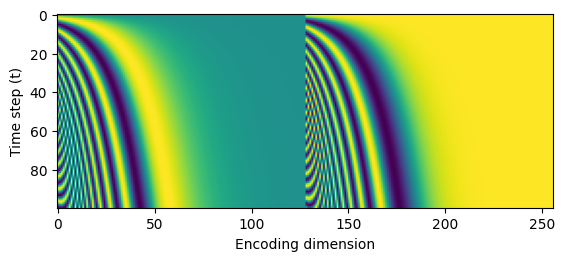

In [15]:
plt.imshow(pos_encs.cpu().numpy())
plt.xlabel("Encoding dimension")
plt.ylabel("Time step (t)")
plt.show()

## Defining a Custom Tokenizer and Text Encoder

Implement the function to tokenize the text ...

In [16]:
import contractions, re, spacy, unicodedata

tokenizers = {"eng": spacy.blank("en"), "spa": spacy.blank("es")}

regular_expression = r"^[a-zA-Z0-9áéíóúüñÁÉÍÓÚÜÑ.,!?¡¿/:()]+$"
pattern = re.compile(unicodedata.normalize("NFC", regular_expression))

def tokenize(text, lang="eng"):
    """Tokenize text."""
    swaps = {"’": "'", "‘": "'", "“": '"', "”": '"', "´": "'", "´´": '"'}
    for old, new in swaps.items():
        text = text.replace(old, new)
    text = contractions.fix(text) if lang == "eng" else text
    tokens = tokenizers[lang](text)
    return [token.text for token in tokens if pattern.match(token.text)]

... implement a class to represent a vocabulary ...

In [17]:
class Vocab:
    """Vocabulary as callable dictionary."""

    def __init__(self, vocab_dict, unk_token="<unk>"):
        """Initialize vocabulary."""
        self.vocab_dict, self.unk_token = vocab_dict, unk_token
        self.default_index = vocab_dict.get(unk_token, -1)
        self.index_to_token = {idx: token for token, idx in vocab_dict.items()}

    def __call__(self, token_or_tokens):
        """Return the index(es) for given token or list of tokens."""
        if not isinstance(token_or_tokens, list):
            return self.vocab_dict.get(token_or_tokens, self.default_index)
        else:
            return [self.vocab_dict.get(token, self.default_index)
                    for token in token_or_tokens]

    def set_default_index(self, index):
        """Set default index for unknown tokens."""
        self.default_index = index

    def lookup_token(self, index_or_indices):
        """Retrieve token corresponding to given index or list of indices."""
        if not isinstance(index_or_indices, list):
            return self.index_to_token.get(int(index_or_indices),
                                           self.unk_token)
        else:
            return [self.index_to_token.get(int(index), self.unk_token)
                    for index in index_or_indices]

    def get_tokens(self):
        """Return a list of tokens ordered by their index."""
        tokens = [None] * len(self.index_to_token)
        for index, token in self.index_to_token.items():
            tokens[index] = token
        return tokens

    def __iter__(self):
        """Iterate over the tokens in the vocabulary."""
        return iter(self.vocab_dict)

    def __len__(self):
        """Return the number of tokens in the vocabulary."""
        return len(self.vocab_dict)

    def __contains__(self, token):
        """Check if a token is in the vocabulary."""
        return token in self.vocab_dict

... implement a function to build vocabulary from an iterator ...

In [18]:
from collections import Counter

def build_vocab_from_iterator(iterator, specials=None, min_freq=1):
    """Build vocabulary from an iterator over tokenized sentences."""
    token_freq = Counter(token for tokens in iterator for token in tokens)
    vocab, index = {}, 0
    if specials:
        for token in specials:
            vocab[token] = index
            index += 1
    for token, freq in token_freq.items():
        if freq >= min_freq:
            vocab[token] = index
            index += 1
    return vocab

... build a custom vocabulary ...

In [19]:
with open("test_sentences.txt", "r") as file:
    test_sentences = [line.strip() for line in file.readlines()]

def sentence_iterator(list_of_sentences):
    """Iterate over a list of sentences to tokenize them."""
    for sentence in list_of_sentences:
        yield tokenize(sentence)

vocab_dict = build_vocab_from_iterator(
    sentence_iterator(sentences + test_sentences),
    specials=["<sos>", "<eos>", "<pad>", "<unk>"], min_freq=1,
)
vocab = Vocab(vocab_dict, unk_token="<unk>")
vocab.set_default_index(vocab(vocab.unk_token))

... check the string-to-number mapping ...

In [20]:
for word, index in vocab_dict.items(): print(f"{word}: {index}")

<sos>: 0
<eos>: 1
<pad>: 2
<unk>: 3
zero: 4
squirrels: 5
are: 6
playing: 7
in: 8
the: 9
park: 10
,: 11
while: 12
two: 13
resting: 14
.: 15
How: 16
many: 17
active: 18
?: 19
At: 20
beach: 21
there: 22
baskets: 23
nine: 24
surfboards: 25
and: 26
seven: 27
towels: 28
storage: 29
items: 30
On: 31
farm: 32
cows: 33
9: 34
horses: 35
3: 36
chickens: 37
mammals: 38
do: 39
you: 40
see: 41
In: 42
living: 43
room: 44
six: 45
rugs: 46
0: 47
cushions: 48
decor: 49
barn: 50
will: 51
spot: 52
4: 53
pigs: 54
goats: 55
eight: 56
hens: 57
ruminants: 58
A: 59
group: 60
of: 61
tourists: 62
visits: 63
a: 64
theme: 65
them: 66
adults: 67
visiting: 68
Near: 69
fountain: 70
2: 71
koi: 72
fish: 73
turtles: 74
lilies: 75
reptiles: 76
present: 77
singers: 78
performed: 79
sopranos: 80
vocalists: 81
benches: 82
5: 83
fountains: 84
seating: 85
options: 86
three: 87
one: 88
Provide: 89
visual: 90
handwritten: 91
digit: 92
countertop: 93
plates: 94
mugs: 95
bowls: 96
drinking: 97
vessels: 98
pilots: 99
fly: 100
for:

... implemet a function to pad and process ...

In [21]:
def pad_and_process(texts, vocab=vocab, max_token_length=77):
    """Pad and process text."""
    batch_tokens = []
    for text_prompt in texts:
        tokens = ([vocab("<sos>")]
                   + [vocab(token) for token in tokenize(text_prompt)]
                   + [vocab("<eos>")])

        if len(tokens) > max_token_length:
            tokens = tokens[:max_token_length]
        else:
            tokens += [vocab("<pad>")] * (max_token_length - len(tokens))

        tokens = torch.tensor(tokens, dtype=torch.long)
        batch_tokens.append(tokens)
    return torch.stack(batch_tokens)
    

... observe a tokenized version of an example text prompt ...

In [22]:
_, _, example_sentence = random.choice(trainset)
tokens = pad_and_process([example_sentence])
print(example_sentence), print(tokens);

In the greenhouse, there are 6 pots, 1 trays, and 7 seedlings. How many plant containers are there?
tensor([[  0,  42,   9, 387,  11,  22,   6, 114, 384,  11, 220, 222,  11,  26,
         207, 388,  15,  16,  17, 389, 198,   6,  22,  19,   1,   2,   2,   2,
           2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
           2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
           2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
           2,   2,   2,   2,   2,   2,   2]])


... implement a class for a custom text encoder ...

In [23]:
class TextEncoder(torch.nn.Module):
    """Text encoder."""

    def __init__(self, max_token_length, vocab_size, embedding_dim, num_heads):
        """Initialize the text encoder module."""
        super(TextEncoder, self).__init__()

        self.token_embedding = torch.nn.Embedding(vocab_size, embedding_dim)
        self.position_encoding = positional_encoding(
            torch.arange(0, max_token_length).unsqueeze(1), embedding_dim,
        )
        
        self.self_attention = torch.nn.MultiheadAttention(
            embedding_dim, num_heads=num_heads, batch_first=True,
        )
        self.layer_norm1 = torch.nn.LayerNorm(embedding_dim)
        self.layer_norm2 = torch.nn.LayerNorm(embedding_dim)

        self.feed_forward = torch.nn.Sequential(
            torch.nn.Linear(embedding_dim, embedding_dim), torch.nn.GELU(),
            torch.nn.Linear(embedding_dim, embedding_dim),
        )

    def forward(self, tokens):
        """Forward pass of the text encoder module."""
        token_embeddings = self.token_embedding(tokens)
        position_encodings = (self.position_encoding
                              .repeat(tokens.size(0), 1, 1).to(tokens.device))

        token_embeddings_with_pos = token_embeddings + position_encodings

        normalized_embeddings = self.layer_norm1(token_embeddings_with_pos)
        attention_output, _ = self.self_attention(query=normalized_embeddings,
                                                  key=normalized_embeddings,
                                                  value=normalized_embeddings)
        attention_output = attention_output + normalized_embeddings

        residual_input = attention_output
        normalized_attention_output = self.layer_norm2(attention_output)
        feed_forward_output = self.feed_forward(normalized_attention_output)
        residual_output = feed_forward_output + residual_input

        return residual_output

... instantiate a custom text encoder ...

In [24]:
custom_text_encoder = TextEncoder(
    max_token_length=77, vocab_size=len(vocab), embedding_dim=768, num_heads=4,
).to(device)

... and check the shape of example text prompts.

In [25]:
_, _, example_sentence = random.choice(trainset)
tokens = pad_and_process([example_sentence])
text_embedding = custom_text_encoder(tokens.to(device))

print(f"tokens shape: {tokens.shape}")
print(f"text embeddings shape: {text_embedding.shape}")

tokens shape: torch.Size([1, 77])
text embeddings shape: torch.Size([1, 77, 768])


## Defining the Attention U-Net

In [ ]:
import deeplay as dl

unet_template = dl.AttentionUNet(
    in_channels=1, channels=[32, 64, 128], base_channels=[256, 256],
    channel_attention=[True, True, True], out_channels=1,
    position_embedding_dim=pos_enc_dim, num_classes=10,
    context_embedding_dim=768,
)
unet = unet_template.create().to(device)

## Training the Diffusion Model

Define the data loader ...

In [27]:
loader = dl.DataLoader(dataset=trainset, batch_size=128, shuffle=True)

... define the loss function ...

In [28]:
criterion = torch.nn.MSELoss()

... define the optimizer ...

In [29]:
optimizer = torch.optim.AdamW(
    list(unet.parameters()) + list(custom_text_encoder.parameters()), lr=1e-4,
)

...  instantiate the diffusion class for training ...

In [30]:
diffusion = Diffusion(steps=1000, beta_start=1e-4, beta_end=0.02, img_size=28)

...implement a function to prepare the data ...

In [31]:
def prepare_data(image, steps=1000, device=device):
    """Prepare data."""
    batch_size = image.shape[0]
    t = torch.randint(low=0, high=steps, size=(batch_size,)).to(device)
    image = image.to(device)
    x_t, noise = diffusion.forward_diffusion(image, t)
    t_pos_enc = positional_encoding(t.unsqueeze(1), pos_enc_dim)
    return x_t.to(device), t_pos_enc.to(device), noise.to(device)

... and implement the training cycle.


Epoch 1/20
__________
Batch 1/469: Train loss: 1.9992
Batch 101/469: Train loss: 0.2065
Batch 201/469: Train loss: 0.1660
Batch 301/469: Train loss: 0.0730
Batch 401/469: Train loss: 0.0501
----------
Epoch 1/20 : Train loss: 0.1615, Time taken: 0:16:15.372261


U-Net inference: 100%|██████████| 1000/1000 [01:22<00:00, 12.15it/s]


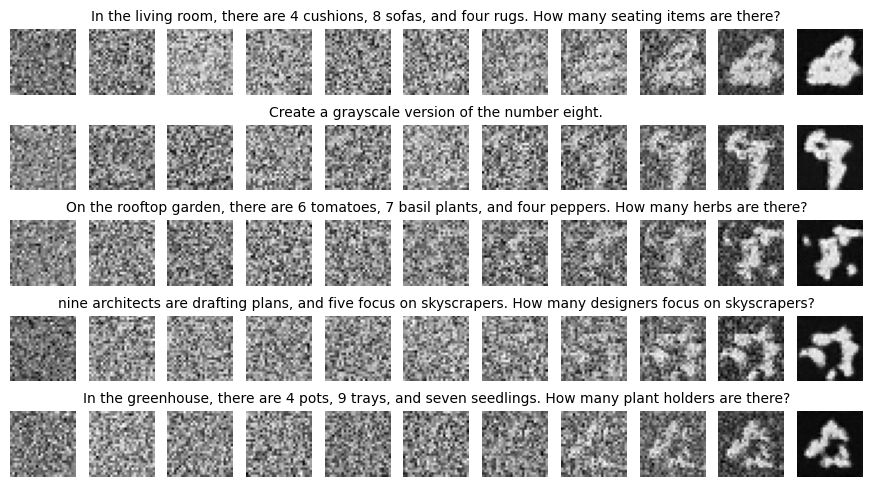


Epoch 2/20
__________
Batch 1/469: Train loss: 0.0628
Batch 101/469: Train loss: 0.0596
Batch 201/469: Train loss: 0.0372
Batch 301/469: Train loss: 0.0489
Batch 401/469: Train loss: 0.0589
----------
Epoch 2/20 : Train loss: 0.0557, Time taken: 0:16:52.466009


U-Net inference: 100%|██████████| 1000/1000 [01:21<00:00, 12.20it/s]


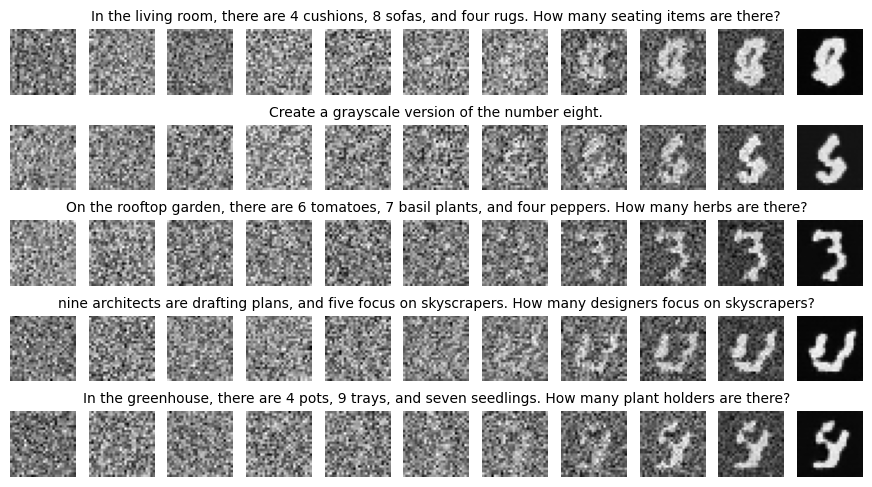


Epoch 3/20
__________
Batch 1/469: Train loss: 0.0752
Batch 101/469: Train loss: 0.0364
Batch 201/469: Train loss: 0.0807
Batch 301/469: Train loss: 0.0689
Batch 401/469: Train loss: 0.0673
----------
Epoch 3/20 : Train loss: 0.0445, Time taken: 0:16:54.070033


U-Net inference: 100%|██████████| 1000/1000 [01:26<00:00, 11.55it/s]


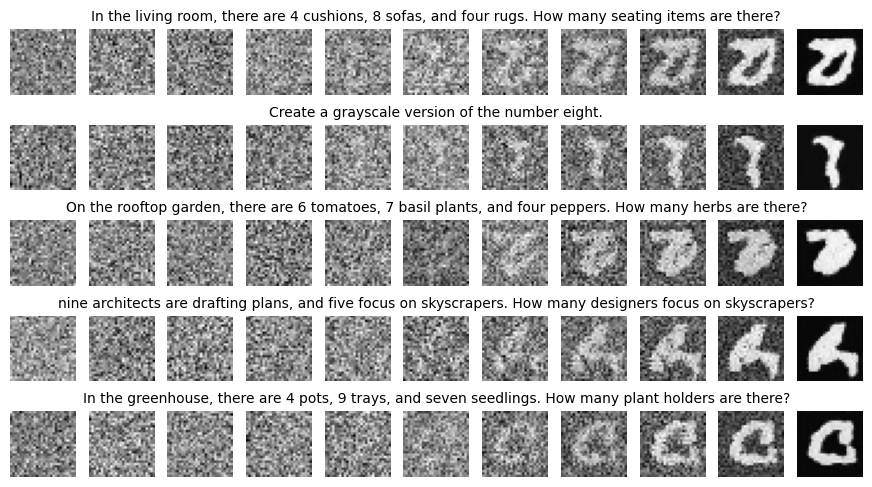


Epoch 4/20
__________
Batch 1/469: Train loss: 0.0426
Batch 101/469: Train loss: 0.0408
Batch 201/469: Train loss: 0.0353
Batch 301/469: Train loss: 0.0703
Batch 401/469: Train loss: 0.0591
----------
Epoch 4/20 : Train loss: 0.0404, Time taken: 0:16:23.667386


U-Net inference: 100%|██████████| 1000/1000 [01:30<00:00, 11.10it/s]


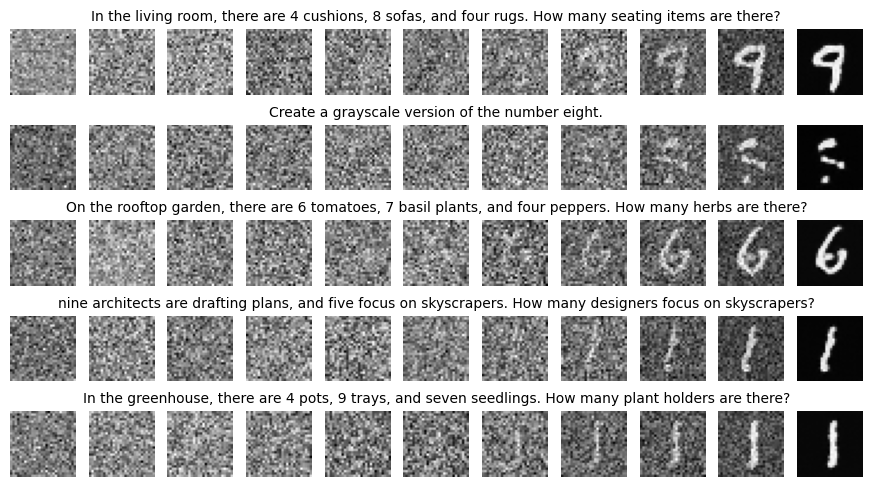


Epoch 5/20
__________
Batch 1/469: Train loss: 0.0361
Batch 101/469: Train loss: 0.0323
Batch 201/469: Train loss: 0.0355
Batch 301/469: Train loss: 0.0378
Batch 401/469: Train loss: 0.0364
----------
Epoch 5/20 : Train loss: 0.0363, Time taken: 0:14:47.664621


U-Net inference: 100%|██████████| 1000/1000 [01:28<00:00, 11.32it/s]


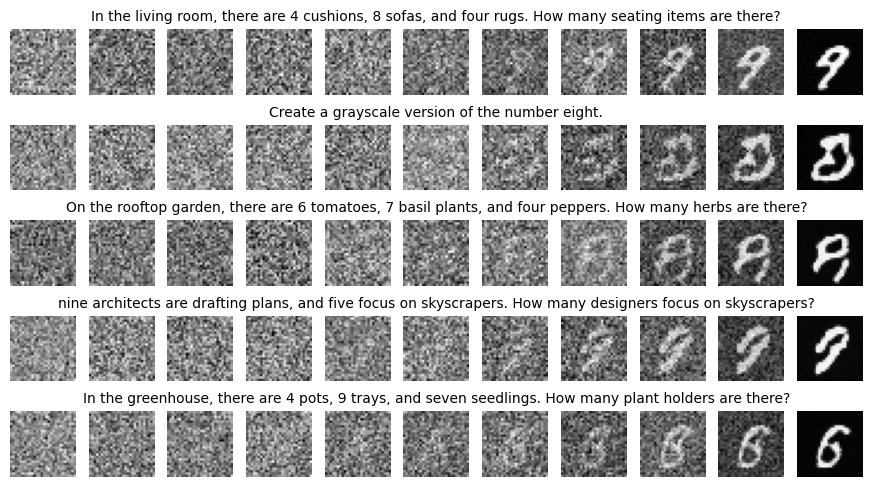


Epoch 6/20
__________
Batch 1/469: Train loss: 0.0302
Batch 101/469: Train loss: 0.0258
Batch 201/469: Train loss: 0.0319
Batch 301/469: Train loss: 0.0316
Batch 401/469: Train loss: 0.0205
----------
Epoch 6/20 : Train loss: 0.0346, Time taken: 0:17:00.205227


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.10it/s]


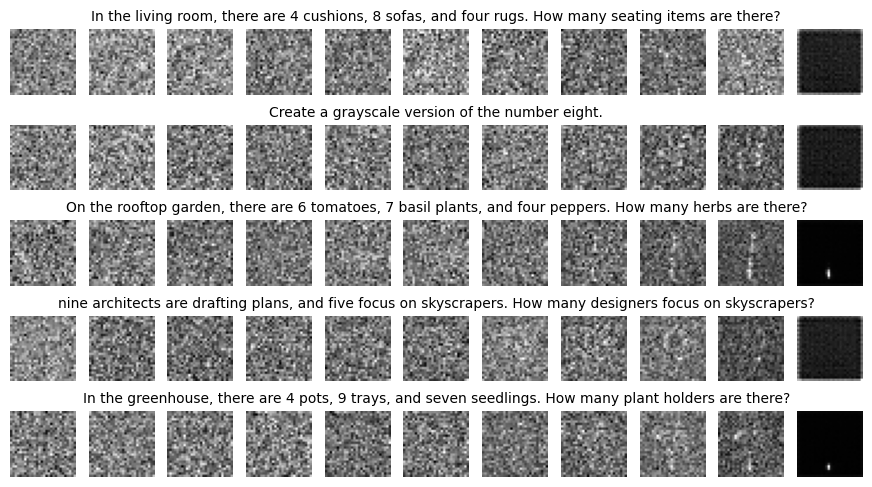


Epoch 7/20
__________
Batch 1/469: Train loss: 0.0407
Batch 101/469: Train loss: 0.0346
Batch 201/469: Train loss: 0.0287
Batch 301/469: Train loss: 0.0249
Batch 401/469: Train loss: 0.0339
----------
Epoch 7/20 : Train loss: 0.0325, Time taken: 0:16:50.820782


U-Net inference: 100%|██████████| 1000/1000 [01:28<00:00, 11.36it/s]


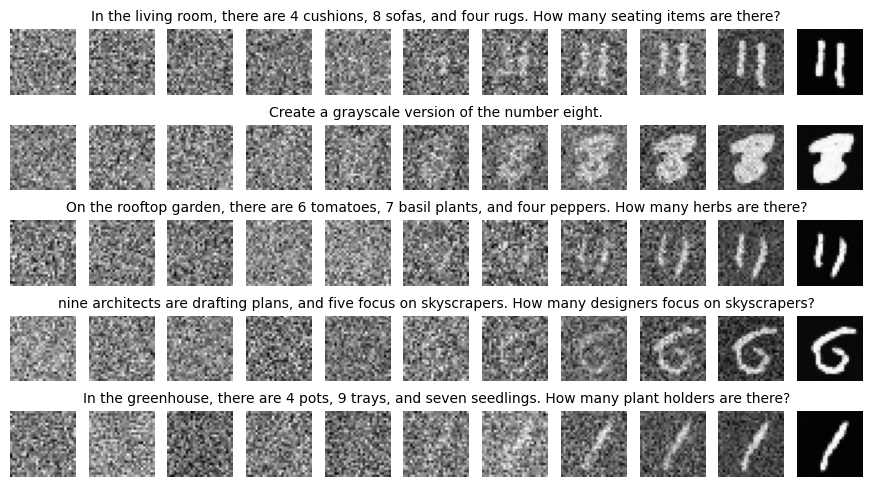


Epoch 8/20
__________
Batch 1/469: Train loss: 0.0336
Batch 101/469: Train loss: 0.0272
Batch 201/469: Train loss: 0.0289
Batch 301/469: Train loss: 0.0338
Batch 401/469: Train loss: 0.0384
----------
Epoch 8/20 : Train loss: 0.0316, Time taken: 0:17:01.529669


U-Net inference: 100%|██████████| 1000/1000 [01:09<00:00, 14.47it/s]


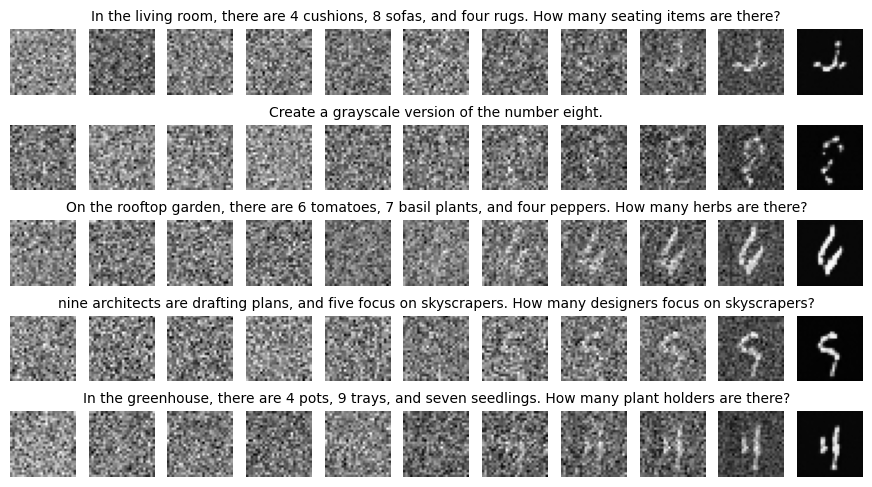


Epoch 9/20
__________
Batch 1/469: Train loss: 0.0245
Batch 101/469: Train loss: 0.0279
Batch 201/469: Train loss: 0.0324
Batch 301/469: Train loss: 0.0314
Batch 401/469: Train loss: 0.0366
----------
Epoch 9/20 : Train loss: 0.0303, Time taken: 0:16:15.447009


U-Net inference: 100%|██████████| 1000/1000 [01:17<00:00, 12.84it/s]


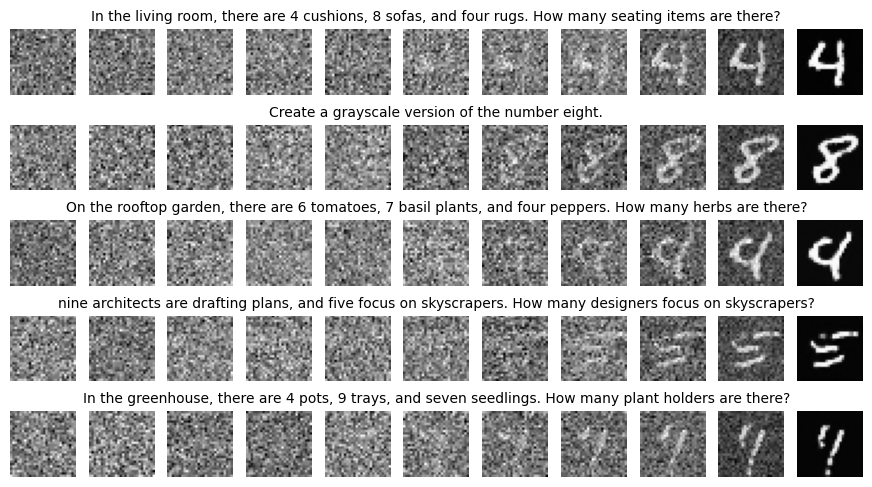


Epoch 10/20
__________
Batch 1/469: Train loss: 0.0278
Batch 101/469: Train loss: 0.0298
Batch 201/469: Train loss: 0.0307
Batch 301/469: Train loss: 0.0399
Batch 401/469: Train loss: 0.0294
----------
Epoch 10/20 : Train loss: 0.0292, Time taken: 0:16:56.711317


U-Net inference: 100%|██████████| 1000/1000 [01:24<00:00, 11.84it/s]


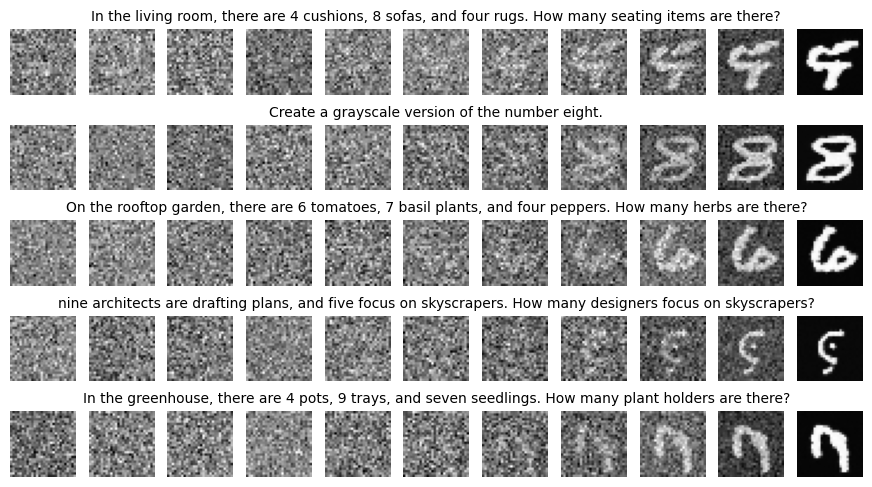


Epoch 11/20
__________
Batch 1/469: Train loss: 0.0295
Batch 101/469: Train loss: 0.0293
Batch 201/469: Train loss: 0.0368
Batch 301/469: Train loss: 0.0331
Batch 401/469: Train loss: 0.0290
----------
Epoch 11/20 : Train loss: 0.0280, Time taken: 0:16:48.933185


U-Net inference: 100%|██████████| 1000/1000 [01:21<00:00, 12.20it/s]


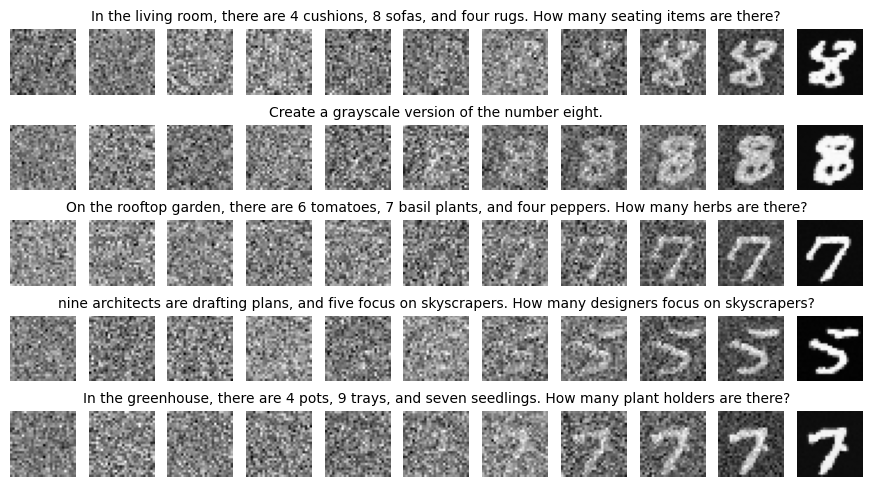


Epoch 12/20
__________
Batch 1/469: Train loss: 0.0279
Batch 101/469: Train loss: 0.0266
Batch 201/469: Train loss: 0.0270
Batch 301/469: Train loss: 0.0237
Batch 401/469: Train loss: 0.0274
----------
Epoch 12/20 : Train loss: 0.0276, Time taken: 0:16:39.316177


U-Net inference: 100%|██████████| 1000/1000 [01:14<00:00, 13.36it/s]


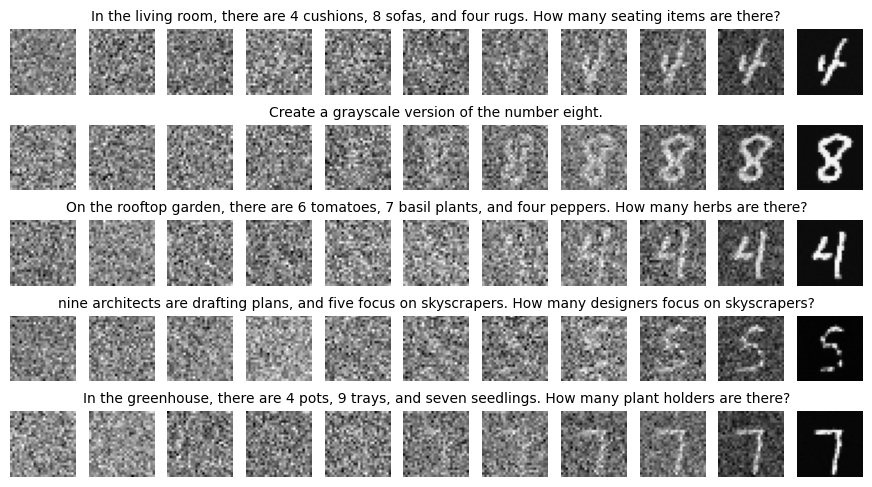


Epoch 13/20
__________
Batch 1/469: Train loss: 0.0245
Batch 101/469: Train loss: 0.0256
Batch 201/469: Train loss: 0.0291
Batch 301/469: Train loss: 0.0278
Batch 401/469: Train loss: 0.0257
----------
Epoch 13/20 : Train loss: 0.0273, Time taken: 0:16:58.490260


U-Net inference: 100%|██████████| 1000/1000 [01:20<00:00, 12.48it/s]


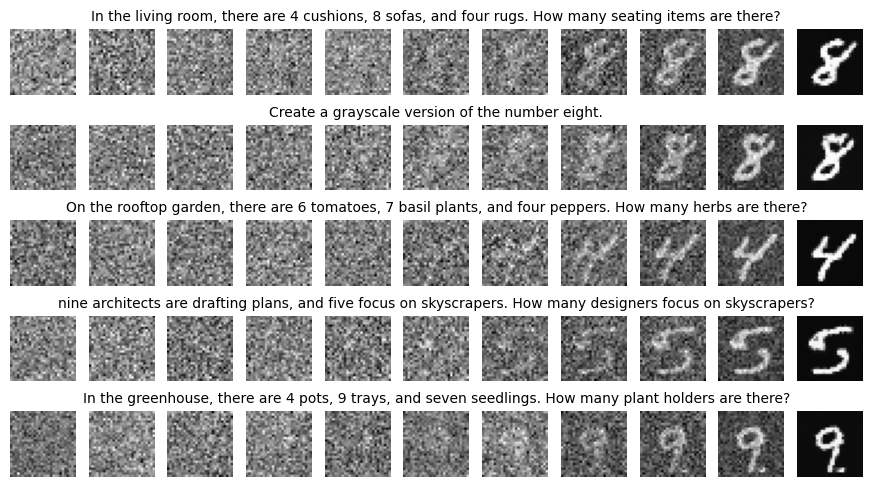


Epoch 14/20
__________
Batch 1/469: Train loss: 0.0250
Batch 101/469: Train loss: 0.0269
Batch 201/469: Train loss: 0.0245
Batch 301/469: Train loss: 0.0235
Batch 401/469: Train loss: 0.0214
----------
Epoch 14/20 : Train loss: 0.0266, Time taken: 0:16:33.754907


U-Net inference: 100%|██████████| 1000/1000 [01:18<00:00, 12.79it/s]


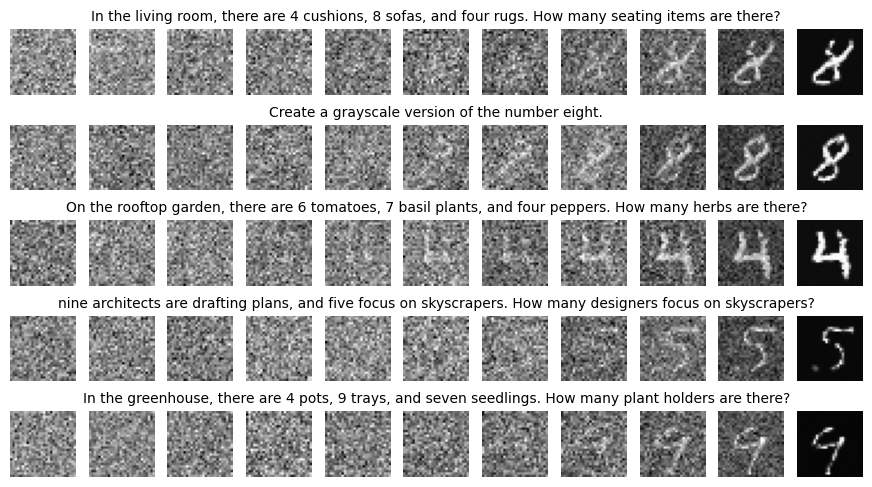


Epoch 15/20
__________
Batch 1/469: Train loss: 0.0234
Batch 101/469: Train loss: 0.0345
Batch 201/469: Train loss: 0.0219
Batch 301/469: Train loss: 0.0296
Batch 401/469: Train loss: 0.0320
----------
Epoch 15/20 : Train loss: 0.0261, Time taken: 0:16:45.279719


U-Net inference: 100%|██████████| 1000/1000 [01:15<00:00, 13.20it/s]


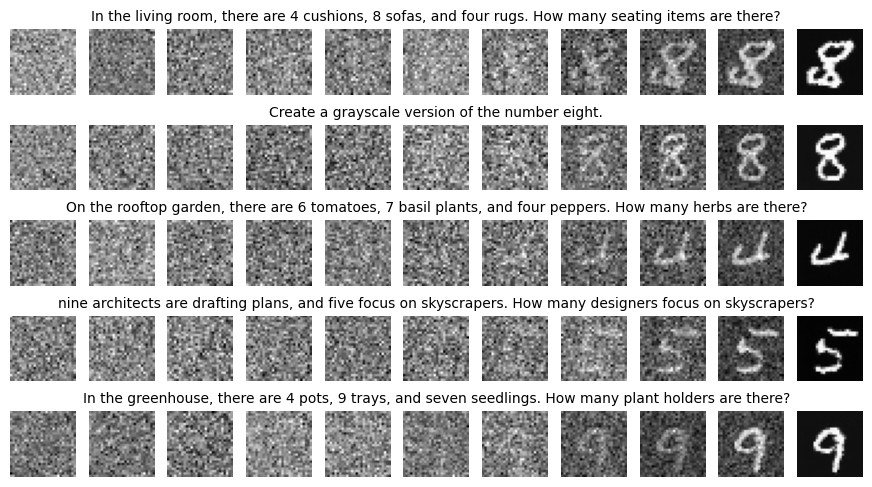


Epoch 16/20
__________
Batch 1/469: Train loss: 0.0236
Batch 101/469: Train loss: 0.0261
Batch 201/469: Train loss: 0.0226
Batch 301/469: Train loss: 0.0295
Batch 401/469: Train loss: 0.0282
----------
Epoch 16/20 : Train loss: 0.0252, Time taken: 0:16:36.661763


U-Net inference: 100%|██████████| 1000/1000 [01:13<00:00, 13.64it/s]


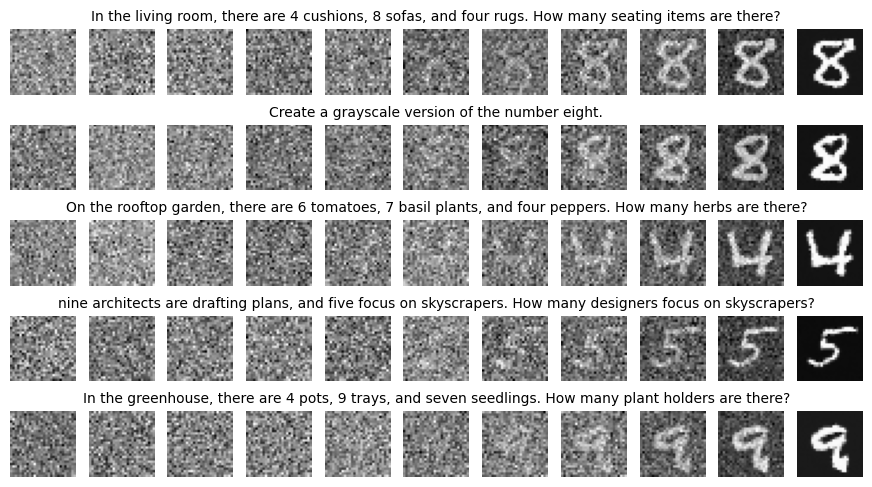


Epoch 17/20
__________
Batch 1/469: Train loss: 0.0290
Batch 101/469: Train loss: 0.0278
Batch 201/469: Train loss: 0.0257
Batch 301/469: Train loss: 0.0239
Batch 401/469: Train loss: 0.0235
----------
Epoch 17/20 : Train loss: 0.0255, Time taken: 0:16:12.085580


U-Net inference: 100%|██████████| 1000/1000 [01:21<00:00, 12.33it/s]


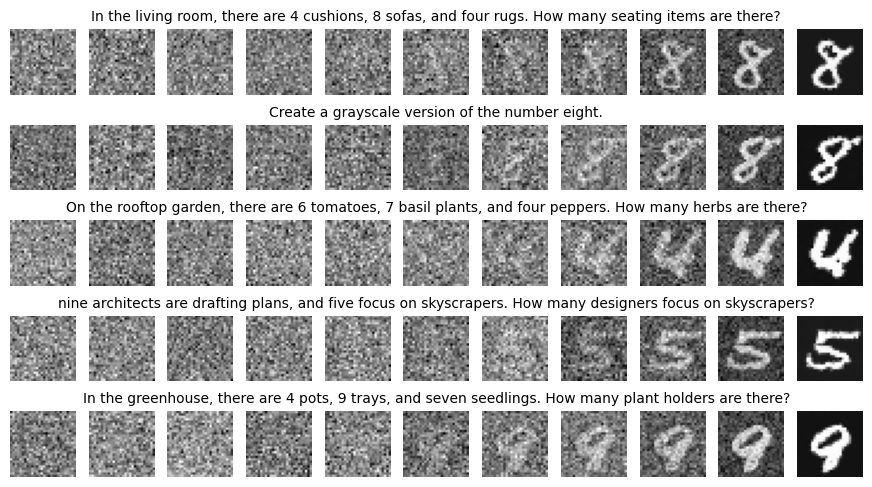


Epoch 18/20
__________
Batch 1/469: Train loss: 0.0292
Batch 101/469: Train loss: 0.0232
Batch 201/469: Train loss: 0.0217
Batch 301/469: Train loss: 0.0189
Batch 401/469: Train loss: 0.0275
----------
Epoch 18/20 : Train loss: 0.0251, Time taken: 0:16:30.198171


U-Net inference: 100%|██████████| 1000/1000 [01:26<00:00, 11.58it/s]


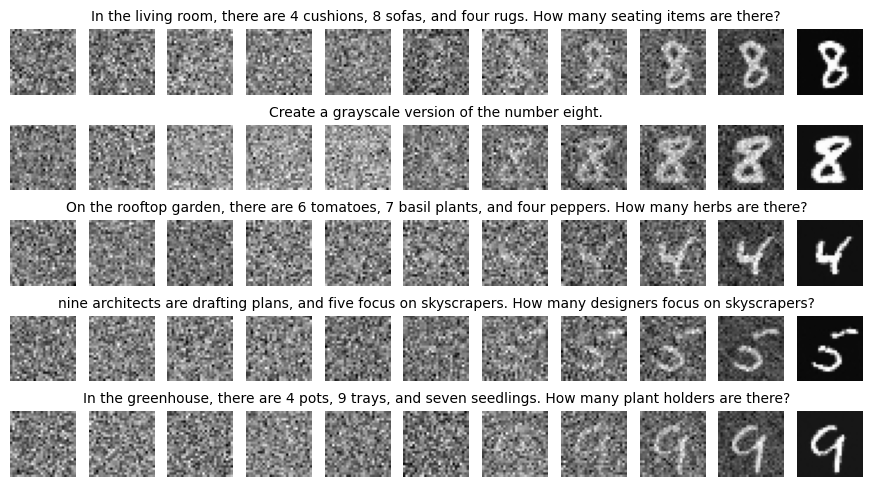


Epoch 19/20
__________
Batch 1/469: Train loss: 0.0246
Batch 101/469: Train loss: 0.0236
Batch 201/469: Train loss: 0.0201
Batch 301/469: Train loss: 0.0216
Batch 401/469: Train loss: 0.0303
----------
Epoch 19/20 : Train loss: 0.0249, Time taken: 0:16:43.869474


U-Net inference: 100%|██████████| 1000/1000 [01:07<00:00, 14.89it/s]


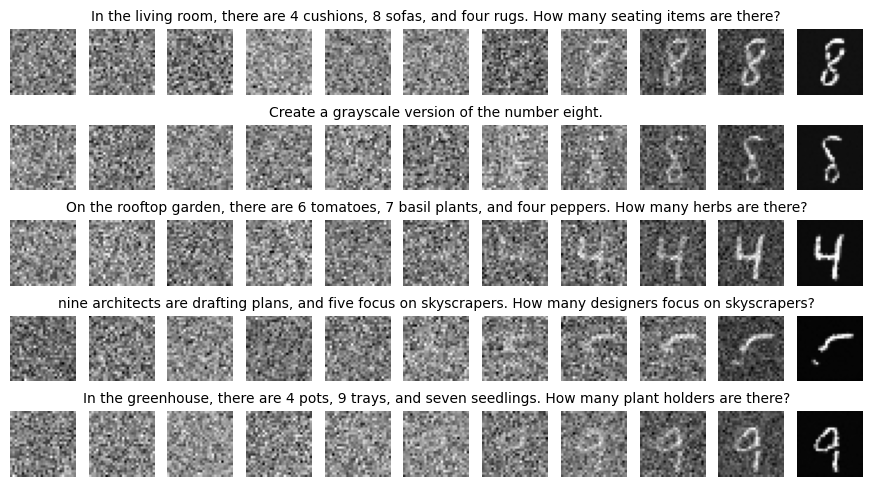


Epoch 20/20
__________
Batch 1/469: Train loss: 0.0226
Batch 101/469: Train loss: 0.0203
Batch 201/469: Train loss: 0.0232
Batch 301/469: Train loss: 0.0208
Batch 401/469: Train loss: 0.0267
----------
Epoch 20/20 : Train loss: 0.0246, Time taken: 0:16:45.329202


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.07it/s]


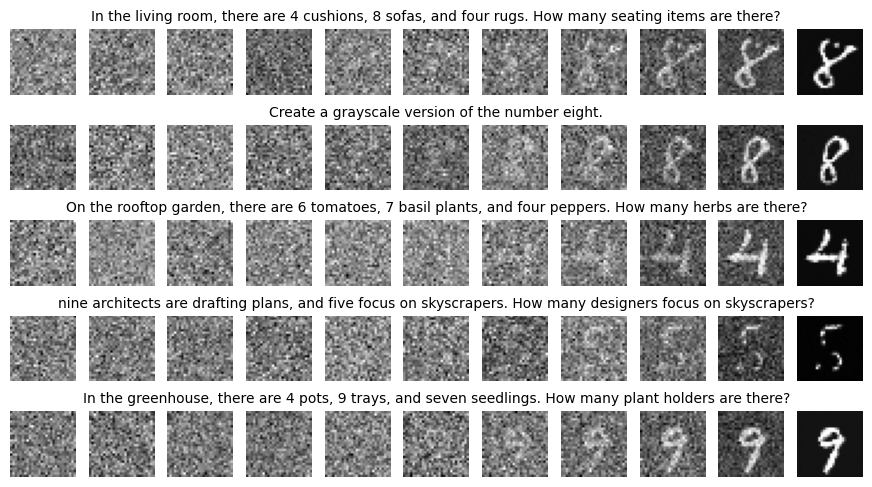

In [32]:
import numpy as np
import time
from datetime import timedelta

epochs = 20

n_images, steps = 5, [999, 900, 800, 700, 600, 500, 400, 300, 200, 100, 0]
train_loss = []
example_sentences = random.sample(test_sentences, n_images)
for epoch in range(epochs):
    unet.train(), custom_text_encoder.train()

    start_time = time.time()
    print("\n" + f"Epoch {epoch + 1}/{epochs}" + "\n" + "_" * 10)

    running_loss = 0.0
    for batch_idx, (images, _, sentences) in enumerate(loader, start=0):
        x_t, t_pos_enc, noise = prepare_data(images)

        tokens = pad_and_process(sentences)
        text_embeddings = custom_text_encoder(tokens.to(device))
        context = None if np.random.rand() < 0.1 else text_embeddings

        outputs = unet(x=x_t, t=t_pos_enc, context=context)

        optimizer.zero_grad()
        loss = criterion(outputs, noise)
        loss.backward()
        optimizer.step()

        if batch_idx % 100 == 0:
            print(f"Batch {batch_idx + 1}/{len(loader)}: "
                  f"Train loss: {loss.item():.4f}")
        running_loss += loss.item()

    train_loss.append(running_loss / len(loader))
    end_time = time.time()

    print("-" * 10 + "\n" + f"Epoch {epoch + 1}/{epochs} : "
          f"Train loss: {train_loss[-1]:.4f}, "
          f"Time taken: {timedelta(seconds=end_time - start_time)}")

    unet.eval(), custom_text_encoder.eval()
    tokens = pad_and_process(example_sentences)
    text_embeddings = custom_text_encoder(tokens.to(device))
    generated_images = diffusion.reverse_diffusion(
        model=unet, n_images=n_images, n_channels=1, pos_enc_dim=pos_enc_dim,
        pos_enc_func=positional_encoding, save_time_steps=steps,
        context=text_embeddings, guidance_strength=3,
    )

    fig = plt.figure(figsize=(len(steps), 1.2 * n_images))
    for idx in range(n_images):
        image_reverse_diff_traj = generated_images[idx]
        for j in range(len(steps)):
            plt.subplot(n_images, len(steps), idx * len(steps) + j + 1)
            plt.imshow(image_reverse_diff_traj[j]
                       .permute(1, 2, 0).cpu().numpy(), cmap="gray")
            plt.axis("off")
            if j == 5: plt.title(example_sentences[idx], fontsize=10)
    plt.show()
    plt.close()

## Training with CLIP Tokenizer and CLIP Text Encoder

Create another instance of the attention U-Net ...

In [33]:
unet_clip = unet_template.create().to(device)

... create an optimizer without the custom text encoder ...

In [34]:
optimizer_clip = torch.optim.AdamW(unet_clip.parameters(), lr=1e-4)

... import the pre-trained CLIP tokenizer and CLIP text encoder ...

In [35]:
from transformers import CLIPTextModel, CLIPTokenizer

CLIP_tokenizer = CLIPTokenizer.from_pretrained(
    "openai/clip-vit-large-patch14", torch_dtype=torch.float32,
)
CLIP_text_encoder = CLIPTextModel.from_pretrained(
    "openai/clip-vit-large-patch14", torch_dtype=torch.float32,
).to(device)

/Users/giovannivolpe/Documents/GitHub/DeepLearningCrashCourse/py_env_book/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


... check the tokens and the text embeddings of an example text prompt generated by CLIP ...

In [36]:
example_sentence = random.choice(test_sentences)
tokens = CLIP_tokenizer(example_sentence, padding="max_length",
                        max_length=CLIP_tokenizer.model_max_length,
                        truncation=True, return_tensors="pt")
text_embedding = CLIP_text_encoder(tokens.input_ids.to(device))[0]
print(example_sentence), print(tokens.input_ids)
print(f"tokens shape: {tokens.input_ids.shape}")
print(f"text embeddings: {text_embedding.shape}")

Create a grayscale version of the number 5.
tensor([[49406,  3380,   320, 12703,  5879,  3273,   539,   518,  2842,   276,
           269, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]])
tokens shape: torch.Size([1, 77])
text embeddings: torch.Size([1, 77, 768])


... freeze the weights of CLIP ...

In [37]:
for param in CLIP_text_encoder.parameters():
    param.requires_grad = False

... and train the model with CLIP.


Epoch 1/20
__________
Batch 1/469: Train loss: 1.2581
Batch 101/469: Train loss: 0.1415
Batch 201/469: Train loss: 0.0890
Batch 301/469: Train loss: 0.0791
Batch 401/469: Train loss: 0.0713
----------
Epoch 1/20 : Train loss: 0.1357, Time taken: 0:29:06.124370


U-Net inference: 100%|██████████| 1000/1000 [01:30<00:00, 11.04it/s]


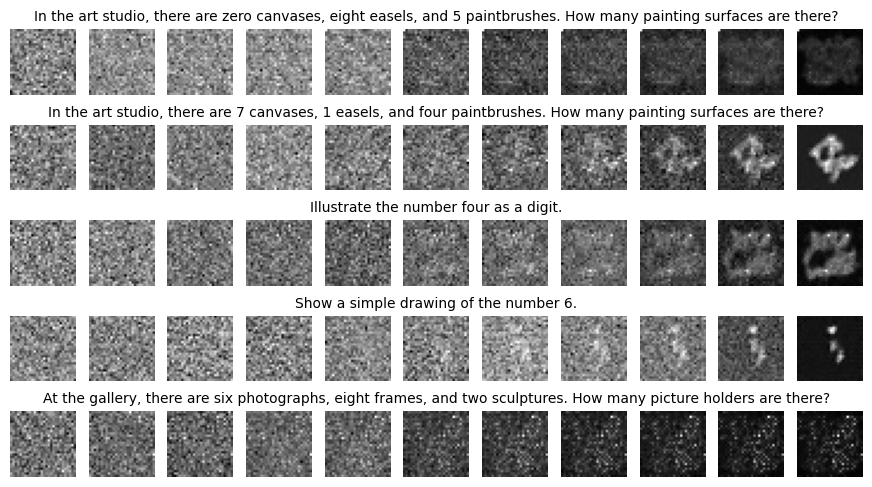


Epoch 2/20
__________
Batch 1/469: Train loss: 0.0550
Batch 101/469: Train loss: 0.0639
Batch 201/469: Train loss: 0.0570
Batch 301/469: Train loss: 0.0421
Batch 401/469: Train loss: 0.0405
----------
Epoch 2/20 : Train loss: 0.0483, Time taken: 0:29:19.964451


U-Net inference: 100%|██████████| 1000/1000 [01:26<00:00, 11.62it/s]


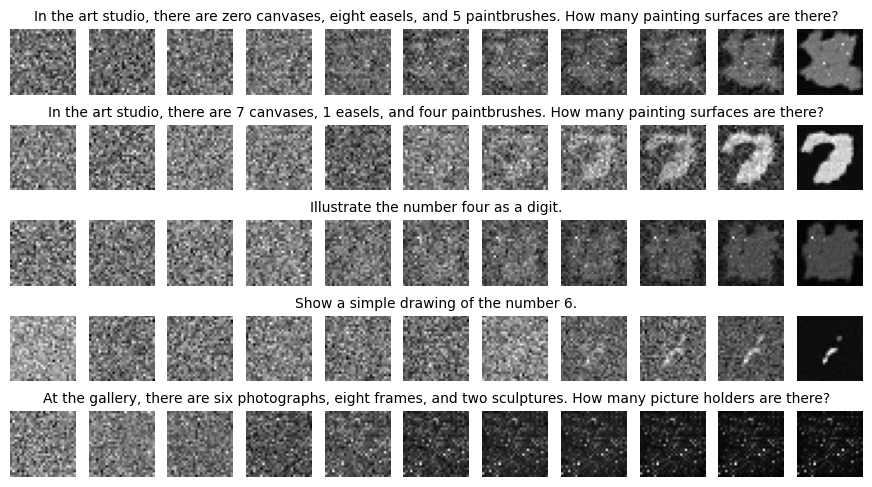


Epoch 3/20
__________
Batch 1/469: Train loss: 0.0344
Batch 101/469: Train loss: 0.0282
Batch 201/469: Train loss: 0.0399
Batch 301/469: Train loss: 0.0356
Batch 401/469: Train loss: 0.0402
----------
Epoch 3/20 : Train loss: 0.0389, Time taken: 0:28:58.112828


U-Net inference: 100%|██████████| 1000/1000 [01:24<00:00, 11.90it/s]


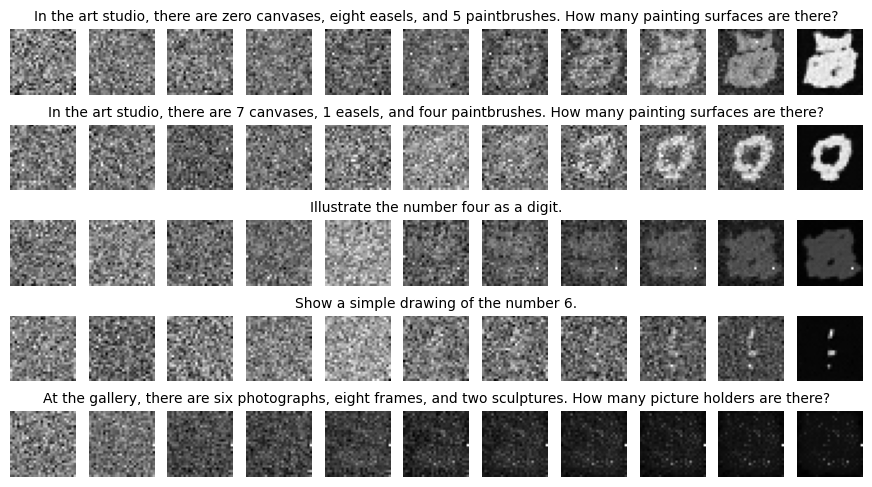


Epoch 4/20
__________
Batch 1/469: Train loss: 0.0313
Batch 101/469: Train loss: 0.0310
Batch 201/469: Train loss: 0.0328
Batch 301/469: Train loss: 0.0408
Batch 401/469: Train loss: 0.0357
----------
Epoch 4/20 : Train loss: 0.0347, Time taken: 0:29:33.455004


U-Net inference: 100%|██████████| 1000/1000 [01:15<00:00, 13.33it/s]


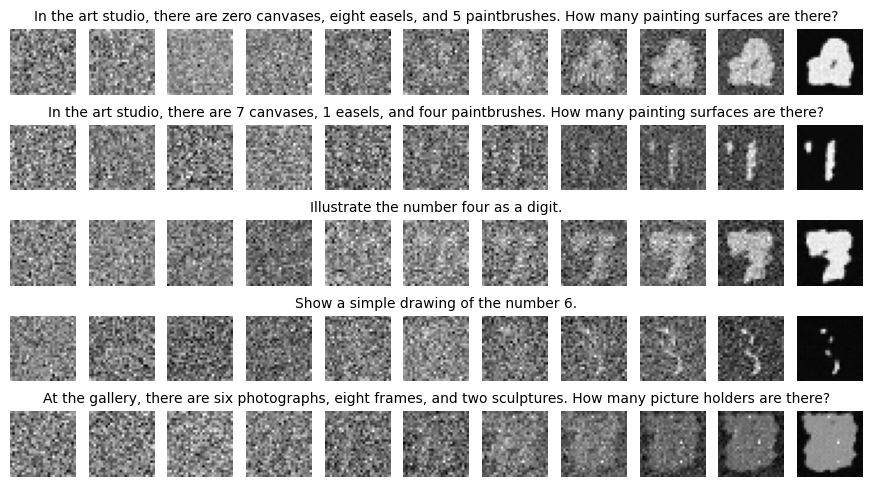


Epoch 5/20
__________
Batch 1/469: Train loss: 0.0352
Batch 101/469: Train loss: 0.0378
Batch 201/469: Train loss: 0.0345
Batch 301/469: Train loss: 0.0357
Batch 401/469: Train loss: 0.0445
----------
Epoch 5/20 : Train loss: 0.0322, Time taken: 0:29:05.294780


U-Net inference: 100%|██████████| 1000/1000 [01:19<00:00, 12.59it/s]


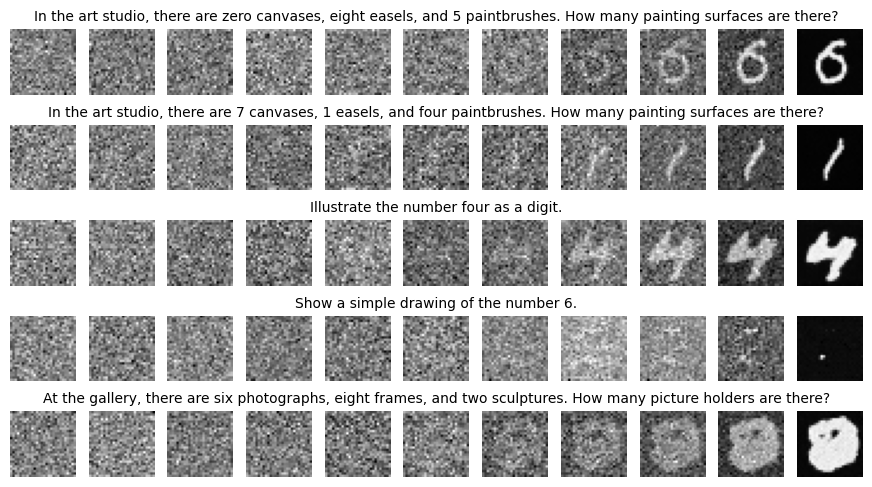


Epoch 6/20
__________
Batch 1/469: Train loss: 0.0336
Batch 101/469: Train loss: 0.0277
Batch 201/469: Train loss: 0.0224
Batch 301/469: Train loss: 0.0285
Batch 401/469: Train loss: 0.0321
----------
Epoch 6/20 : Train loss: 0.0305, Time taken: 0:29:28.071120


U-Net inference: 100%|██████████| 1000/1000 [01:26<00:00, 11.58it/s]


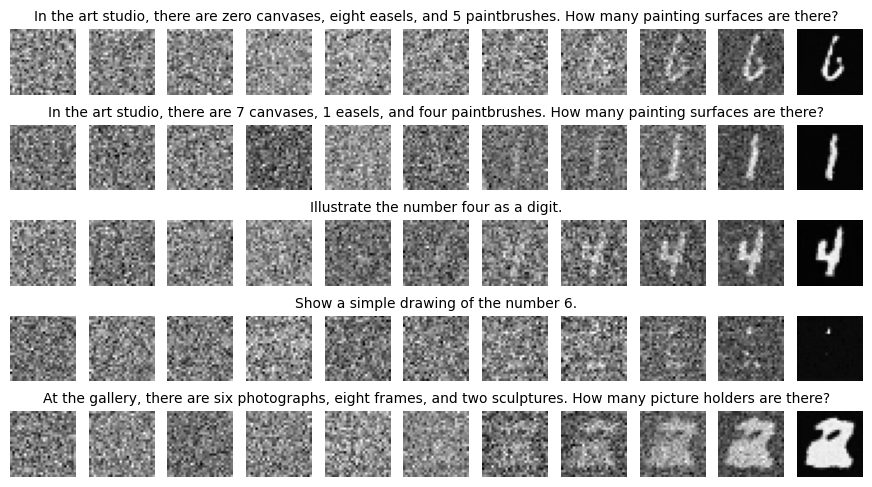


Epoch 7/20
__________
Batch 1/469: Train loss: 0.0341
Batch 101/469: Train loss: 0.0330
Batch 201/469: Train loss: 0.0290
Batch 301/469: Train loss: 0.0292
Batch 401/469: Train loss: 0.0333
----------
Epoch 7/20 : Train loss: 0.0294, Time taken: 0:29:02.700584


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.10it/s]


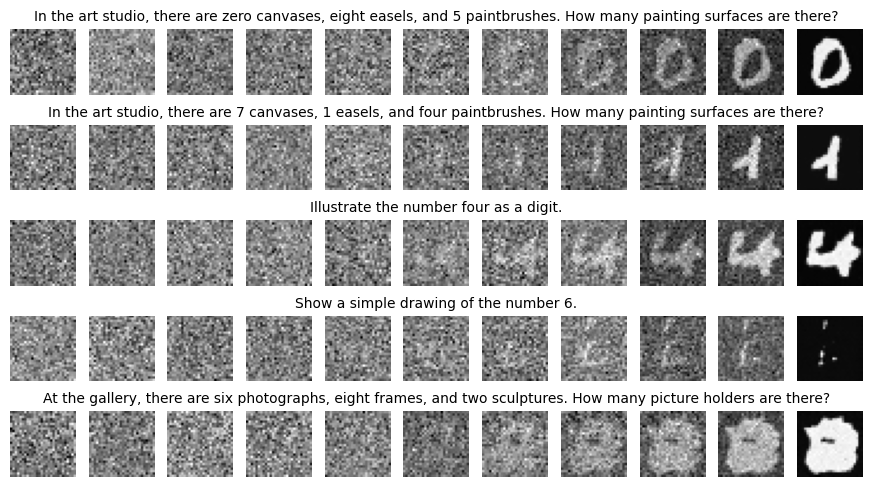


Epoch 8/20
__________
Batch 1/469: Train loss: 0.0293
Batch 101/469: Train loss: 0.0313
Batch 201/469: Train loss: 0.0309
Batch 301/469: Train loss: 0.0353
Batch 401/469: Train loss: 0.0274
----------
Epoch 8/20 : Train loss: 0.0282, Time taken: 0:29:37.133627


U-Net inference: 100%|██████████| 1000/1000 [01:11<00:00, 14.03it/s]


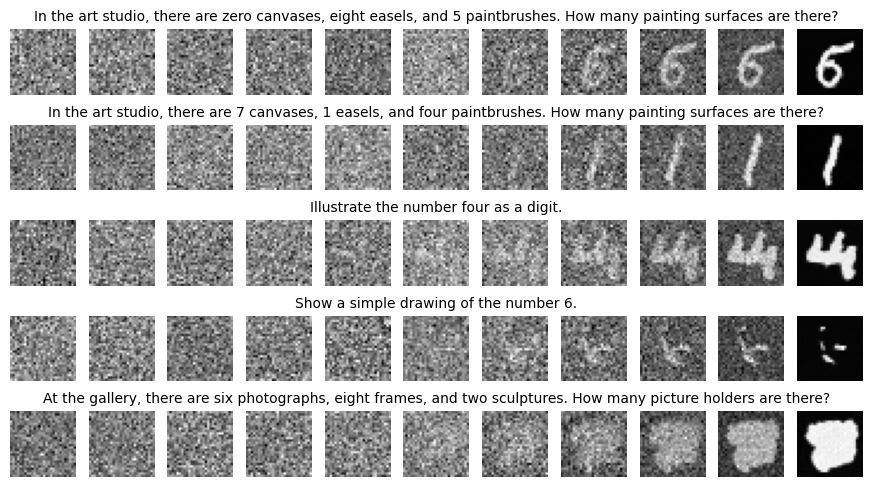


Epoch 9/20
__________
Batch 1/469: Train loss: 0.0236
Batch 101/469: Train loss: 0.0225
Batch 201/469: Train loss: 0.0269
Batch 301/469: Train loss: 0.0255
Batch 401/469: Train loss: 0.0317
----------
Epoch 9/20 : Train loss: 0.0274, Time taken: 0:28:41.788609


U-Net inference: 100%|██████████| 1000/1000 [01:13<00:00, 13.58it/s]


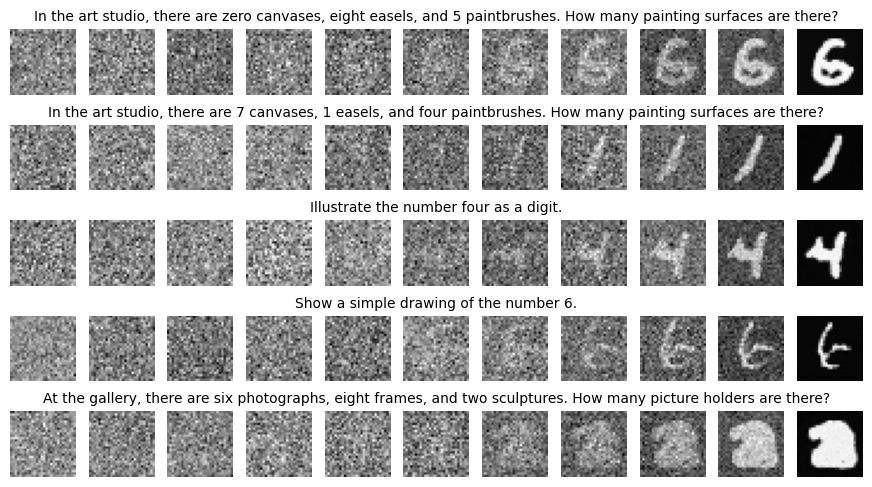


Epoch 10/20
__________
Batch 1/469: Train loss: 0.0253
Batch 101/469: Train loss: 0.0253
Batch 201/469: Train loss: 0.0210
Batch 301/469: Train loss: 0.0227
Batch 401/469: Train loss: 0.0226
----------
Epoch 10/20 : Train loss: 0.0268, Time taken: 0:29:26.065681


U-Net inference: 100%|██████████| 1000/1000 [01:11<00:00, 14.06it/s]


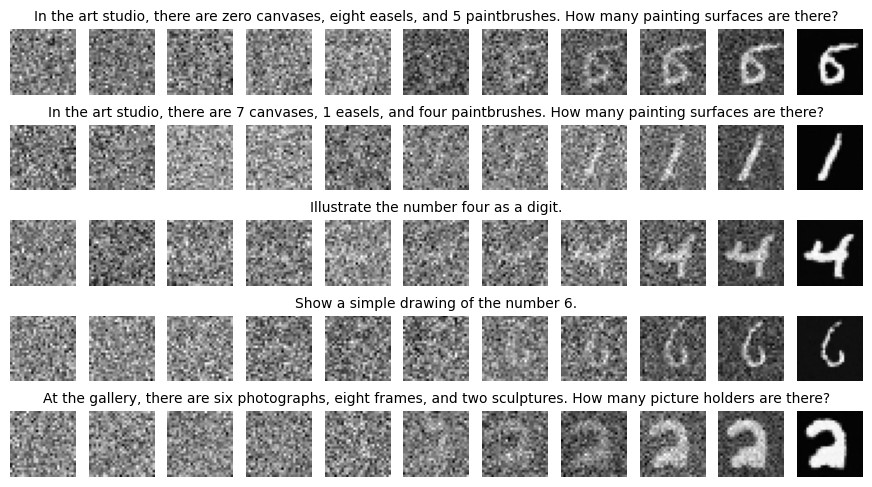


Epoch 11/20
__________
Batch 1/469: Train loss: 0.0280
Batch 101/469: Train loss: 0.0221
Batch 201/469: Train loss: 0.0235
Batch 301/469: Train loss: 0.0298
Batch 401/469: Train loss: 0.0237
----------
Epoch 11/20 : Train loss: 0.0264, Time taken: 0:28:49.828488


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.05it/s]


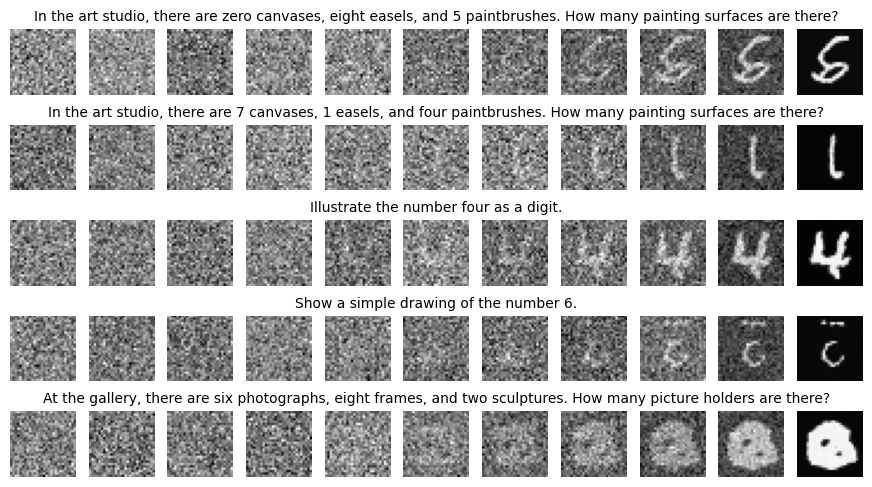


Epoch 12/20
__________
Batch 1/469: Train loss: 0.0305
Batch 101/469: Train loss: 0.0277
Batch 201/469: Train loss: 0.0251
Batch 301/469: Train loss: 0.0253
Batch 401/469: Train loss: 0.0294
----------
Epoch 12/20 : Train loss: 0.0260, Time taken: 0:29:35.387400


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.08it/s]


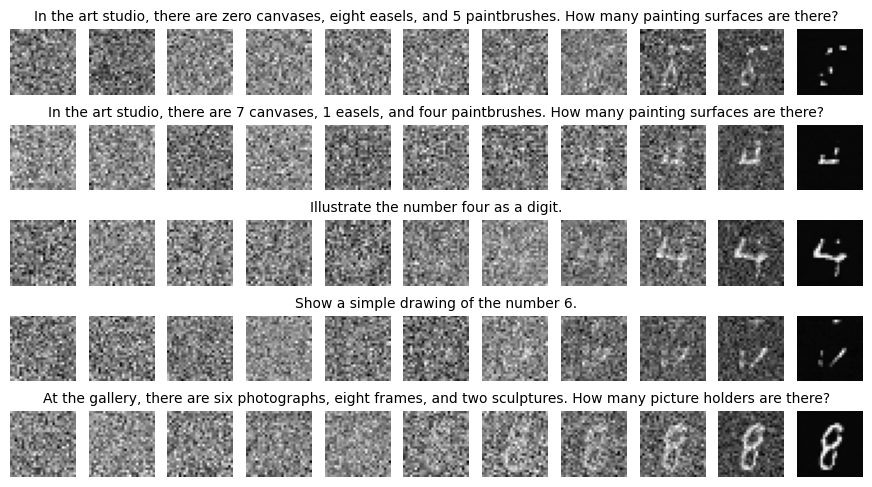


Epoch 13/20
__________
Batch 1/469: Train loss: 0.0242
Batch 101/469: Train loss: 0.0263
Batch 201/469: Train loss: 0.0232
Batch 301/469: Train loss: 0.0270
Batch 401/469: Train loss: 0.0257
----------
Epoch 13/20 : Train loss: 0.0256, Time taken: 0:29:13.618503


U-Net inference: 100%|██████████| 1000/1000 [01:19<00:00, 12.54it/s]


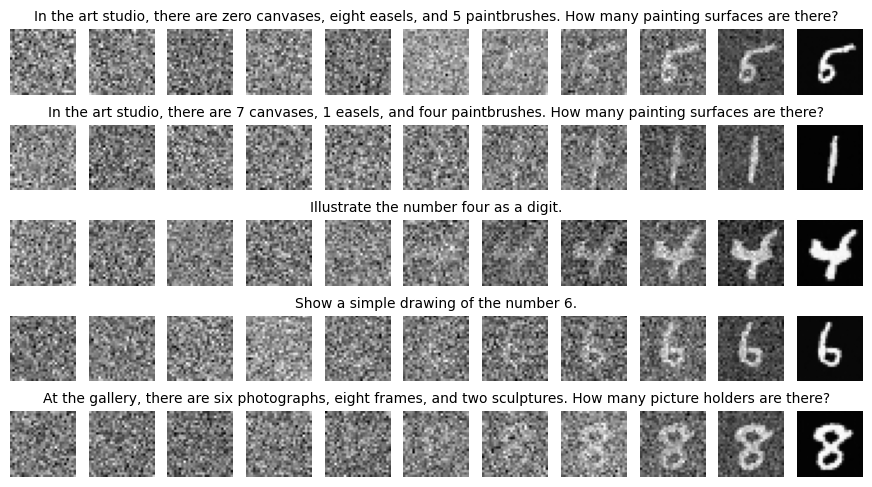


Epoch 14/20
__________
Batch 1/469: Train loss: 0.0244
Batch 101/469: Train loss: 0.0225
Batch 201/469: Train loss: 0.0310
Batch 301/469: Train loss: 0.0199
Batch 401/469: Train loss: 0.0304
----------
Epoch 14/20 : Train loss: 0.0250, Time taken: 0:28:38.702749


U-Net inference: 100%|██████████| 1000/1000 [01:17<00:00, 12.84it/s]


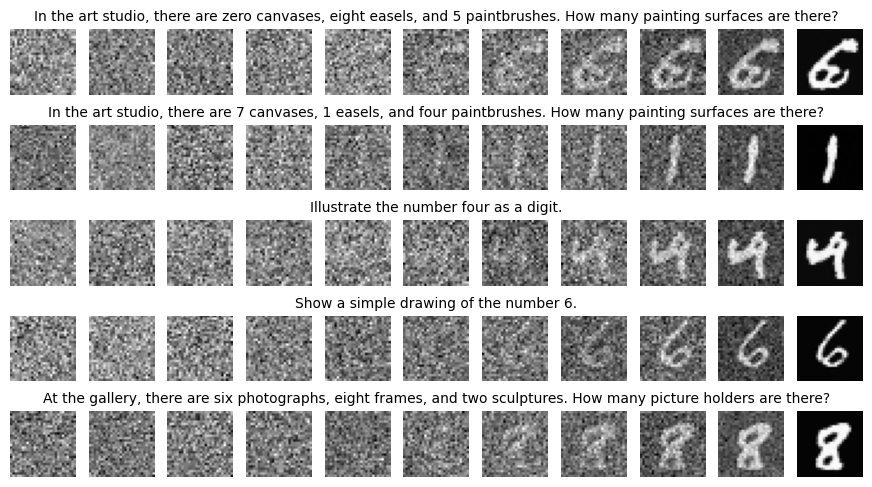


Epoch 15/20
__________
Batch 1/469: Train loss: 0.0224
Batch 101/469: Train loss: 0.0234
Batch 201/469: Train loss: 0.0208
Batch 301/469: Train loss: 0.0237
Batch 401/469: Train loss: 0.0314
----------
Epoch 15/20 : Train loss: 0.0249, Time taken: 0:57:49.987708


U-Net inference: 100%|██████████| 1000/1000 [01:11<00:00, 14.07it/s]


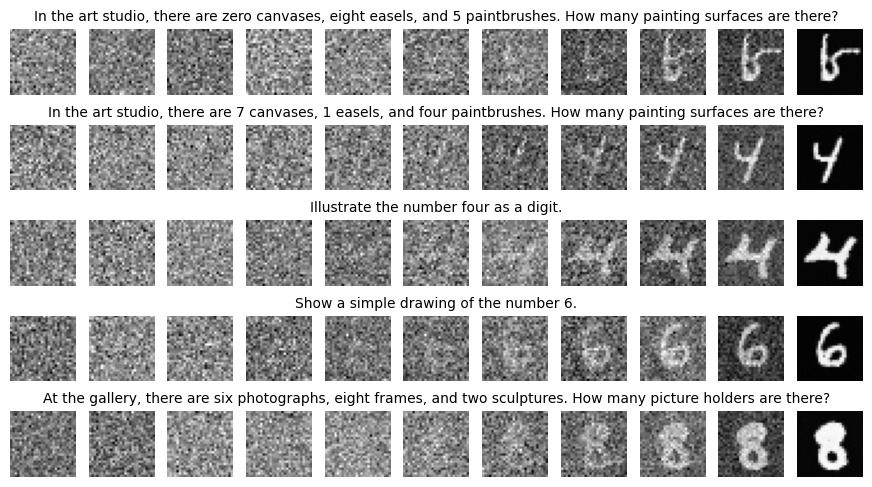


Epoch 16/20
__________
Batch 1/469: Train loss: 0.0235
Batch 101/469: Train loss: 0.0262
Batch 201/469: Train loss: 0.0252
Batch 301/469: Train loss: 0.0210
Batch 401/469: Train loss: 0.0229
----------
Epoch 16/20 : Train loss: 0.0247, Time taken: 0:29:34.189606


U-Net inference: 100%|██████████| 1000/1000 [01:16<00:00, 13.10it/s]


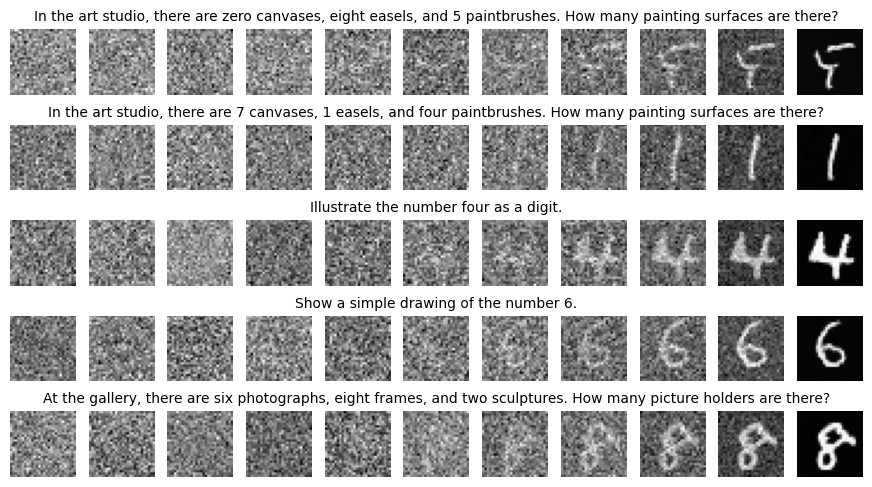


Epoch 17/20
__________
Batch 1/469: Train loss: 0.0225
Batch 101/469: Train loss: 0.0268
Batch 201/469: Train loss: 0.0277
Batch 301/469: Train loss: 0.0212
Batch 401/469: Train loss: 0.0188
----------
Epoch 17/20 : Train loss: 0.0245, Time taken: 0:29:15.360161


U-Net inference: 100%|██████████| 1000/1000 [01:18<00:00, 12.82it/s]


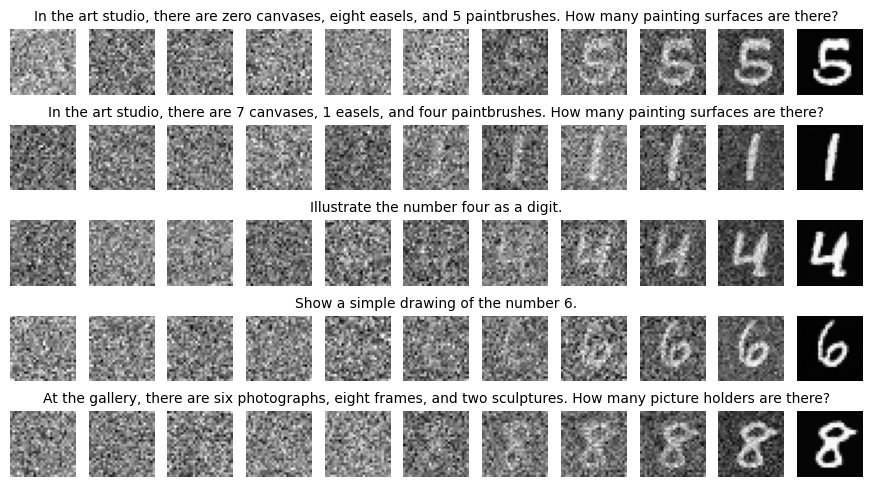


Epoch 18/20
__________
Batch 1/469: Train loss: 0.0258
Batch 101/469: Train loss: 0.0240
Batch 201/469: Train loss: 0.0216
Batch 301/469: Train loss: 0.0269
Batch 401/469: Train loss: 0.0224
----------
Epoch 18/20 : Train loss: 0.0239, Time taken: 0:29:39.608562


U-Net inference: 100%|██████████| 1000/1000 [01:19<00:00, 12.58it/s]


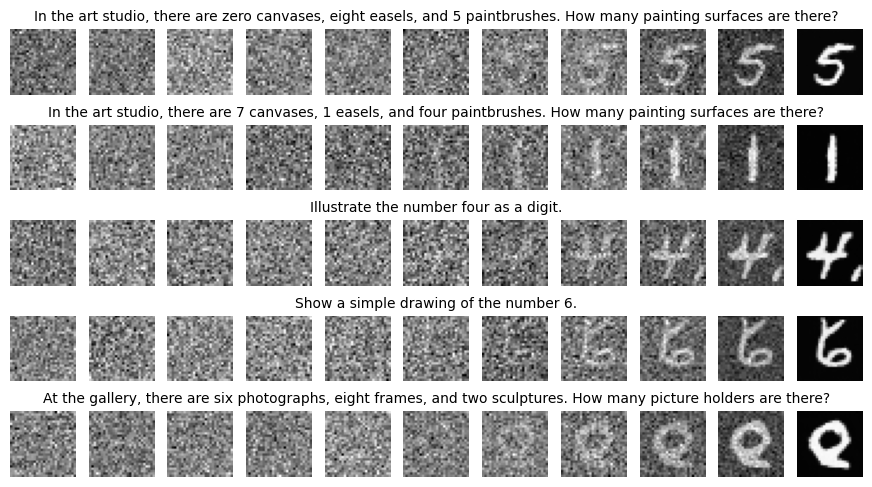


Epoch 19/20
__________
Batch 1/469: Train loss: 0.0242
Batch 101/469: Train loss: 0.0258
Batch 201/469: Train loss: 0.0248
Batch 301/469: Train loss: 0.0282
Batch 401/469: Train loss: 0.0197
----------
Epoch 19/20 : Train loss: 0.0239, Time taken: 0:30:00.907268


U-Net inference: 100%|██████████| 1000/1000 [01:11<00:00, 14.05it/s]


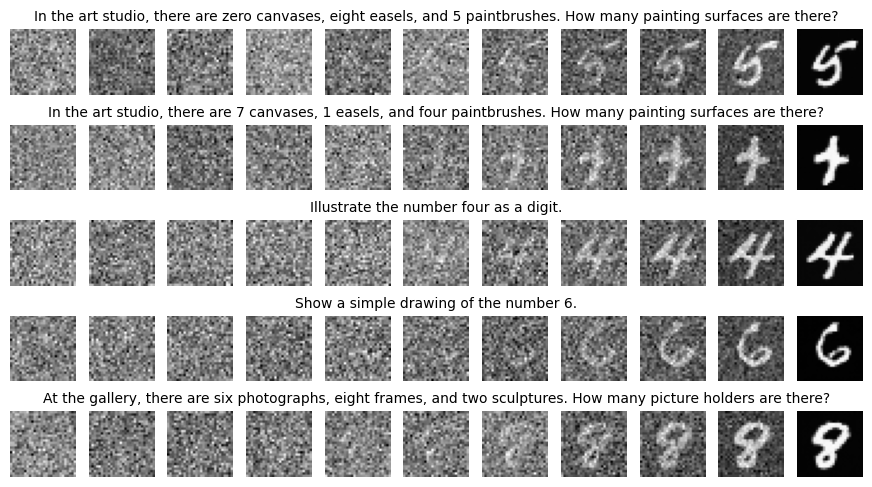


Epoch 20/20
__________
Batch 1/469: Train loss: 0.0184
Batch 101/469: Train loss: 0.0215
Batch 201/469: Train loss: 0.0207
Batch 301/469: Train loss: 0.0242
Batch 401/469: Train loss: 0.0230
----------
Epoch 20/20 : Train loss: 0.0240, Time taken: 0:29:22.959239


U-Net inference: 100%|██████████| 1000/1000 [01:03<00:00, 15.77it/s]


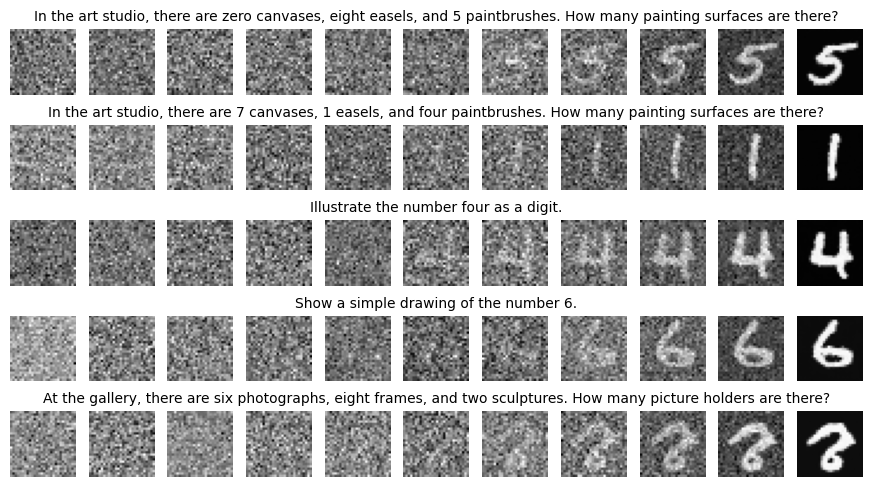

In [38]:
epochs = 20

n_images, steps = 5, [999, 900, 800, 700, 600, 500, 400, 300, 200, 100, 0]
train_loss = []
example_sentences = random.sample(test_sentences, n_images)
for epoch in range(epochs):
    unet_clip.train()

    start_time = time.time()
    print("\n" + f"Epoch {epoch + 1}/{epochs}" + "\n" + "_" * 10)

    running_loss = 0.0
    for batch_idx, (images, _, sentences) in enumerate(loader, start=0):
        x_t, t_pos_enc, noise = prepare_data(images)

        tokens = CLIP_tokenizer(
            sentences, padding="max_length",
            max_length=CLIP_tokenizer.model_max_length, truncation=True,
            return_tensors="pt",
        )
        text_embeddings = CLIP_text_encoder(tokens.input_ids.to(device))[0]
        context = None if np.random.rand() < 0.1 else text_embeddings

        outputs = unet_clip(x=x_t, t=t_pos_enc, context=context)

        optimizer_clip.zero_grad()
        loss = criterion(outputs, noise)
        loss.backward()
        optimizer_clip.step()

        if batch_idx % 100 == 0:
            print(f"Batch {batch_idx + 1}/{len(loader)}: "
                  f"Train loss: {loss.item():.4f}")
        running_loss += loss.item()

    train_loss.append(running_loss / len(loader))
    end_time = time.time()

    print("-" * 10 + "\n" + f"Epoch {epoch + 1}/{epochs} : "
          f"Train loss: {train_loss[-1]:.4f}, "
          f"Time taken: {timedelta(seconds=end_time - start_time)}")

    unet_clip.eval()
    tokens = CLIP_tokenizer(
        example_sentences, padding="max_length",
        max_length=CLIP_tokenizer.model_max_length, truncation=True,
        return_tensors="pt",
    )
    text_embeddings = CLIP_text_encoder(tokens.input_ids.to(device))[0]
    generated_images = diffusion.reverse_diffusion(
        model=unet_clip, n_images=n_images, n_channels=1,
        pos_enc_dim=pos_enc_dim, pos_enc_func=positional_encoding,
        save_time_steps=steps, context=text_embeddings, guidance_strength=3,
    )

    fig = plt.figure(figsize=(len(steps), 1.2 * n_images))
    for idx in range(n_images):
        image_reverse_diff_traj = generated_images[idx]
        for j in range(len(steps)):
            plt.subplot(n_images, len(steps), idx * len(steps) + j + 1)
            plt.imshow(image_reverse_diff_traj[j]
                       .permute(1, 2, 0).cpu().numpy(), cmap="gray")
            plt.axis("off")
            if j == 5: plt.title(example_sentences[idx], fontsize=10)
    plt.show()
    plt.close()